<a href="https://colab.research.google.com/github/KanoonGammy/Python-for-investing/blob/All/5_Project_I_Dynamic_size_on_confidence_level.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install vectorbt
!pip install pandas_ta
!pip install yfinance

In [5]:
import pandas as pd
import vectorbt as vbt
import pandas_ta as ta
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
#import seaborn as sns

In [8]:
import datetime

In [6]:
plt.rcParams['figure.figsize'] = (15,8)

In [ ]:
plt.rcParams

In [9]:
df = yf.download(tickers = 'BTC-USD' , start = datetime.datetime.now() - datetime.timedelta(729) , end = datetime.datetime.now() , interval = '1h' )

[*********************100%***********************]  1 of 1 completed


In [10]:
df.ta.macd(append = True)

,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9
Datetime,,,
2021-01-20 08:00:00+00:00,NaN,NaN,NaN
2021-01-20 09:00:00+00:00,NaN,NaN,NaN
2021-01-20 10:00:00+00:00,NaN,NaN,NaN
2021-01-20 11:00:00+00:00,NaN,NaN,NaN
2021-01-20 12:00:00+00:00,NaN,NaN,NaN
...,...,...,...
2023-01-19 04:00:00+00:00,-120.505141,-9.537882,-110.967258
2023-01-19 05:00:00+00:00,-113.131248,-1.731192,-111.400056
2023-01-19 06:00:00+00:00,-103.220831,6.543380,-109.764211


In [11]:
#create condition s = macd , h = histogram
df['s+,h+'] = (df['MACD_12_26_9'] > 0) & (df['MACDh_12_26_9'] > 0)
df['s+,h-'] = (df['MACD_12_26_9'] > 0) & (df['MACDh_12_26_9'] < 0)
df['s-,h-'] = (df['MACD_12_26_9'] < 0) & (df['MACDh_12_26_9'] < 0)
df['s-,h+'] = (df['MACD_12_26_9'] < 0) & (df['MACDh_12_26_9'] > 0)

In [12]:
#for using , checking
df.loc[(df['MACD_12_26_9'] > 0) & (df['MACDh_12_26_9'] > 0) , 'condition' ] = 's+,h+'
df.loc[(df['MACD_12_26_9'] > 0) & (df['MACDh_12_26_9'] < 0) , 'condition' ] = 's+,h-'
df.loc[(df['MACD_12_26_9'] < 0) & (df['MACDh_12_26_9'] < 0) , 'condition' ] = 's-,h-'
df.loc[(df['MACD_12_26_9'] < 0) & (df['MACDh_12_26_9'] > 0) , 'condition' ] = 's-,h+'

In [15]:
#check
df.iloc[-100: , -8 :]

,MACD_12_26_9,MACDh_12_26_9,MACDs_12_26_9,"s+,h+","s+,h-","s-,h-","s-,h+",condition
Datetime,,,,,,,,
2023-01-15 05:00:00+00:00,137.840792,-70.523269,208.364061,False,True,False,False,"s+,h-"
2023-01-15 06:00:00+00:00,124.004825,-67.487389,191.492214,False,True,False,False,"s+,h-"
2023-01-15 07:00:00+00:00,111.967464,-63.619800,175.587264,False,True,False,False,"s+,h-"
2023-01-15 08:00:00+00:00,93.158182,-65.943266,159.101447,False,True,False,False,"s+,h-"
2023-01-15 09:00:00+00:00,82.718996,-61.105961,143.824957,False,True,False,False,"s+,h-"
...,...,...,...,...,...,...,...,...
2023-01-19 04:00:00+00:00,-120.505141,-9.537882,-110.967258,False,False,True,False,"s-,h-"
2023-01-19 05:00:00+00:00,-113.131248,-1.731192,-111.400056,False,False,True,False,"s-,h-"
2023-01-19 06:00:00+00:00,-103.220831,6.543380,-109.764211,False,False,False,True,"s-,h+"


In [16]:
#prepared for vectorbt
filter = df[['s+,h+' , 's+,h-' , 's-,h-' , 's-,h+']]

In [17]:
filter

,"s+,h+","s+,h-","s-,h-","s-,h+"
Datetime,,,,
2021-01-20 08:00:00+00:00,False,False,False,False
2021-01-20 09:00:00+00:00,False,False,False,False
2021-01-20 10:00:00+00:00,False,False,False,False
2021-01-20 11:00:00+00:00,False,False,False,False
2021-01-20 12:00:00+00:00,False,False,False,False
...,...,...,...,...
2023-01-19 04:00:00+00:00,False,False,True,False
2023-01-19 05:00:00+00:00,False,False,True,False
2023-01-19 06:00:00+00:00,False,False,False,True


In [21]:
#set condition
df['ema_12'] = df.ta.ema(12)
df['ema_26'] = df.ta.ema(26)

In [19]:
#aweight 
df.loc[(df['MACD_12_26_9'] > 0) & (df['MACDh_12_26_9'] > 0) , 'aweight' ] = 1
df.loc[(df['MACD_12_26_9'] > 0) & (df['MACDh_12_26_9'] < 0) , 'aweight' ] = 0.2
df.loc[(df['MACD_12_26_9'] < 0) & (df['MACDh_12_26_9'] < 0) , 'aweight' ] = 0.2
df.loc[(df['MACD_12_26_9'] < 0) & (df['MACDh_12_26_9'] > 0) , 'aweight' ] = 1

In [22]:
long_entries  = df['Close'].vbt.crossed_above(df['ema_12'])
long_exits  = df['Close'].vbt.crossed_below(df['ema_26'])

In [27]:
port = vbt.Portfolio.from_signals(df.Close ,
                                 entries = long_entries ,
                                 exits = long_exits , 
                                 init_cash = 10000,
                                 size = df['aweight'] , 
                                 size_type = 'Percent')

In [28]:
port.plot().show()

In [29]:
long_entries  = df['Close'].vbt.crossed_above(df['ema_12'])
long_exits  = df['ema_12'].vbt.crossed_below(df['ema_26'])
port = vbt.Portfolio.from_signals(df.Close ,
                                 entries = long_entries ,
                                 exits = long_exits , 
                                 init_cash = 10000,
                                 size = df['aweight'] , 
                                 size_type = 'Percent')
port.plot().show() #ช้าอาจจะโดน big shot

In [59]:
df.loc[(df['MACD_12_26_9'] > 0) & (df['MACDh_12_26_9'] > 0) , 'aweight' ] = 1
df.loc[(df['MACD_12_26_9'] > 0) & (df['MACDh_12_26_9'] < 0) , 'aweight' ] = 0.5
df.loc[(df['MACD_12_26_9'] < 0) & (df['MACDh_12_26_9'] < 0) , 'aweight' ] = 0.9
df.loc[(df['MACD_12_26_9'] < 0) & (df['MACDh_12_26_9'] > 0) , 'aweight' ] = 0.6

In [60]:
long_entries  = df['Close'].vbt.crossed_above(df['ema_12'])
long_exits  = df['Close'].vbt.crossed_below(df['ema_26'])
port = vbt.Portfolio.from_signals(df.Close ,
                                 entries = long_entries ,
                                 exits = long_exits , 
                                 init_cash = 10000,
                                 size = df['aweight'] , 
                                 size_type = 'Percent')
port.plot().show()

In [61]:
trades_log = port.trades.records_readable
trades_log

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id
0,0,0,0.276643,2021-01-21 19:00:00+00:00,32532.888672,0.0,2021-01-23 02:00:00+00:00,32344.388672,0.0,-52.147229,-0.005794,Long,Closed,0
1,1,0,0.299098,2021-01-23 05:00:00+00:00,33259.500000,0.0,2021-01-23 09:00:00+00:00,32546.275391,0.0,-213.324115,-0.021444,Long,Closed,1
2,2,0,0.271320,2021-01-23 17:00:00+00:00,32290.611328,0.0,2021-01-23 20:00:00+00:00,32191.410156,0.0,-26.915222,-0.003072,Long,Closed,2
3,3,0,0.270000,2021-01-23 21:00:00+00:00,32358.707031,0.0,2021-01-23 22:00:00+00:00,32095.548828,0.0,-71.052725,-0.008133,Long,Closed,3
4,4,0,0.269759,2021-01-24 02:00:00+00:00,32150.617188,0.0,2021-01-24 12:00:00+00:00,32447.468750,0.0,80.078254,0.009233,Long,Closed,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
825,825,0,0.581338,2023-01-16 15:00:00+00:00,20978.171875,0.0,2023-01-17 01:00:00+00:00,21036.638672,0.0,33.988983,0.002787,Long,Closed,825
826,826,0,0.577807,2023-01-17 03:00:00+00:00,21135.794922,0.0,2023-01-17 23:00:00+00:00,21162.205078,0.0,15.259969,0.001250,Long,Closed,826
827,827,0,0.573891,2023-01-18 02:00:00+00:00,21293.302734,0.0,2023-01-18 08:00:00+00:00,21230.298828,0.0,-36.157382,-0.002959,Long,Closed,827
828,828,0,0.573605,2023-01-18 12:00:00+00:00,21272.419922,0.0,2023-01-18 15:00:00+00:00,21049.835938,0.0,-127.675203,-0.010464,Long,Closed,828


In [62]:
#filter series + series 
df['aweight'][trades_log['Entry Timestamp']]

Datetime
2021-01-21 19:00:00+00:00    0.9
2021-01-23 05:00:00+00:00    1.0
2021-01-23 17:00:00+00:00    0.9
2021-01-23 21:00:00+00:00    0.9
2021-01-24 02:00:00+00:00    0.9
                            ... 
2023-01-16 15:00:00+00:00    0.5
2023-01-17 03:00:00+00:00    0.5
2023-01-18 02:00:00+00:00    0.5
2023-01-18 12:00:00+00:00    0.5
2023-01-19 06:00:00+00:00    0.6
Name: aweight, Length: 830, dtype: float64

In [45]:
#count conditions
df['condition'][trades_log['Entry Timestamp']].value_counts()

s-,h-    261
s-,h+    246
s+,h-    235
s+,h+     88
Name: condition, dtype: int64

In [46]:
#count conditions
df['aweight'][trades_log['Entry Timestamp']].value_counts()

0.4    261
0.6    246
0.5    235
1.0     88
Name: aweight, dtype: int64

In [63]:
result = trades_log.join(df['aweight'] , how ='left' , on= "Entry Timestamp") #
result

,Exit Trade Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status,Position Id,aweight
0,0,0,0.276643,2021-01-21 19:00:00+00:00,32532.888672,0.0,2021-01-23 02:00:00+00:00,32344.388672,0.0,-52.147229,-0.005794,Long,Closed,0,0.9
1,1,0,0.299098,2021-01-23 05:00:00+00:00,33259.500000,0.0,2021-01-23 09:00:00+00:00,32546.275391,0.0,-213.324115,-0.021444,Long,Closed,1,1.0
2,2,0,0.271320,2021-01-23 17:00:00+00:00,32290.611328,0.0,2021-01-23 20:00:00+00:00,32191.410156,0.0,-26.915222,-0.003072,Long,Closed,2,0.9
3,3,0,0.270000,2021-01-23 21:00:00+00:00,32358.707031,0.0,2021-01-23 22:00:00+00:00,32095.548828,0.0,-71.052725,-0.008133,Long,Closed,3,0.9
4,4,0,0.269759,2021-01-24 02:00:00+00:00,32150.617188,0.0,2021-01-24 12:00:00+00:00,32447.468750,0.0,80.078254,0.009233,Long,Closed,4,0.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
825,825,0,0.581338,2023-01-16 15:00:00+00:00,20978.171875,0.0,2023-01-17 01:00:00+00:00,21036.638672,0.0,33.988983,0.002787,Long,Closed,825,0.5
826,826,0,0.577807,2023-01-17 03:00:00+00:00,21135.794922,0.0,2023-01-17 23:00:00+00:00,21162.205078,0.0,15.259969,0.001250,Long,Closed,826,0.5
827,827,0,0.573891,2023-01-18 02:00:00+00:00,21293.302734,0.0,2023-01-18 08:00:00+00:00,21230.298828,0.0,-36.157382,-0.002959,Long,Closed,827,0.5
828,828,0,0.573605,2023-01-18 12:00:00+00:00,21272.419922,0.0,2023-01-18 15:00:00+00:00,21049.835938,0.0,-127.675203,-0.010464,Long,Closed,828,0.5


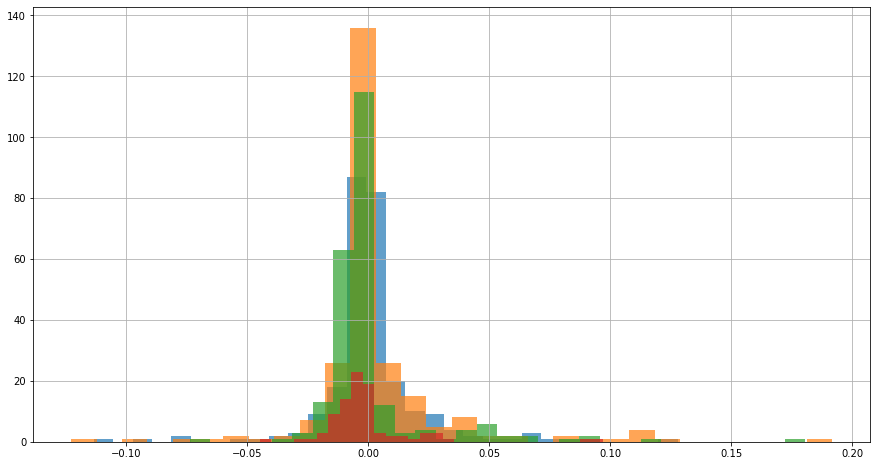

In [67]:
#finding False
result[result.aweight == 0.9]['Return'].hist(bins = 30 , alpha =0.7)
result[result.aweight == 0.6]['Return'].hist(bins = 30 , alpha =0.7)
result[result.aweight == 0.5]['Return'].hist(bins = 30 , alpha =0.7)
result[result.aweight == 1.0]['Return'].hist(bins = 30 , alpha =0.7)
#then adjust aweight and evaluate overview again